In [2]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud

import pandas as pd
import numpy as np

from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.cluster import KMeans

import torch.nn.functional as F
import torch

from torch import Tensor
from transformers import AutoTokenizer, AutoModel
from datasets import load_dataset, Dataset
from torch.utils.data import DataLoader, TensorDataset

from tqdm import tqdm
import matplotlib.pyplot as plt

In [3]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [4]:
table_path = "/kaggle/input/course-work/full_processed_dataset.csv"
data = pd.read_csv(table_path)
data.dropna(axis=0, how='any', inplace=True)
data.parsed_text = data.parsed_text.astype(str)

data.head()

,url,base_category_nm,parsed_text
0,https://aspect-school.ru,Образование,курс маникюр школа обучение ученик мастер ногт...
1,https://rlagency.ru,Развлечения,билет купить руб подробный любовь дк павлово с...
2,https://kozlovatravel.u-on.ru,Развлечения,Автоматизированная система U ON Travel Забыли ...
3,https://rootsyou.tilda.ws,Красота,крем мыло баттеры аромароллер косметика душа п...
4,https://esk.one/p/wadgpcigy2vveo,Образование,прототип блок схема поддержка mind esk one сер...


In [5]:
lol = []
for i in range(data.shape[0]):
    if data.loc[i, 'parsed_text'].find('Страница входа Восстановить Зарегистрироваться') != -1:
        lol.append(i)
print(lol)

[87, 133, 230, 568, 785, 795, 1075, 1216, 1361, 1365, 1638, 1658, 1953, 2061, 2301, 2360, 2519, 2696, 3162, 3186, 3236, 3376, 4330, 4577, 4680, 4882, 4923, 5079, 5173, 5225, 5266, 5303, 5626, 5694, 5740, 5994, 6067, 6232, 6233, 6513, 7210, 7651, 8013, 8041, 8059, 8097, 8101, 8434, 8509, 8552, 8902, 8934, 9094, 9133, 9184, 9369, 9453, 9464, 9575, 9621, 9775, 9864, 9865, 10375, 10425, 10538, 10663, 10711, 10768, 10857, 10868, 11489, 11538, 11568, 11701, 11784, 11919, 12251, 12295, 12320, 12511, 12554, 12644, 12837, 13174, 13203, 13378, 14085, 14376, 14405, 14552, 14719, 15068, 15206, 15251, 15270, 15815, 15959, 15994, 16377, 16435, 16849, 16947, 16999, 17426, 17707, 17779, 17808, 18204, 18273, 18602, 18758, 18821, 18994, 19279, 19609, 19975, 20083, 20227, 20418, 20435, 20563, 20685, 20802, 21165, 21229, 21464, 21499, 21527, 21532, 21586, 21646, 21903, 22078, 22088, 22259, 22965, 22974, 23037, 23105, 23189, 23193, 23372, 23799, 23825, 23978, 24151, 24270, 24292, 24900, 24908, 25125, 25216

In [6]:
data.loc[lol, :]

,url,base_category_nm,parsed_text
87,https://lk.masha.fit,Образование,Страница входа Восстановить Зарегистрироваться...
133,https://course.kaina.ru,Образование,Страница входа Восстановить Зарегистрироваться...
230,https://kurs.speechka.online,Образование,Страница входа Восстановить Зарегистрироваться...
568,https://dociureva.com,Образование,Страница входа Восстановить Зарегистрироваться...
785,https://kurs.smolyaninovablog.ru,Образование,Страница входа Восстановить Зарегистрироваться...
...,...,...,...
36386,https://turkeeva.ru,Образование,Страница входа Восстановить Зарегистрироваться...
36687,https://kidspravo.ru,Цифровые услуги,Страница входа Восстановить Зарегистрироваться...
36701,https://tatiananovinskaya.ru,Образование,Страница входа Восстановить Зарегистрироваться...
36935,https://larina-m.ru,Образование,Страница входа Восстановить Зарегистрироваться...


In [7]:
data.drop(index=lol, inplace=True)

In [8]:
data['base_category_nm'].unique()

array(['Образование', 'Развлечения', 'Красота',
       'Продажа различных товаров', 'Авиабилеты', 'Одежда',
       'Дом и ремонт', 'Одежда и аксессуары', 'Связь и телеком',
       'Медицина', 'Салоны красоты и здоровья',
       'Электроника и бытовая техника', 'Различные услуги',
       'Подарки и сувениры', 'Цифровые услуги',
       'Заведения общественного питания', 'Автозапчасти и автосервисы',
       'Спорт', 'Зоомагазины и ветеринарные клиники', 'Транспорт',
       'Продукты', 'Рукоделие и творчество',
       'Адвокаты и юридические услуги', 'Ювелирные изделия и часы',
       'Книги и канцтовары', 'Отели', 'Печать и сканирование',
       'Танцевальные залы, школы и студии', 'Финансовые услуги', 'Цветы',
       'Магазины игрушек и хобби-товаров', 'Ремонт компьютеров',
       'Жилищно-коммунальные услуги', 'Аптеки', 'Спорттовары',
       'Курьерские услуги', 'Фотостудии', 'Оптика', 'Топливо',
       'Химчистка', 'Ателье и ремонт одежды', 'Ломбарды',
       'Клубы видеоигр', 'Бары, п

In [18]:
def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

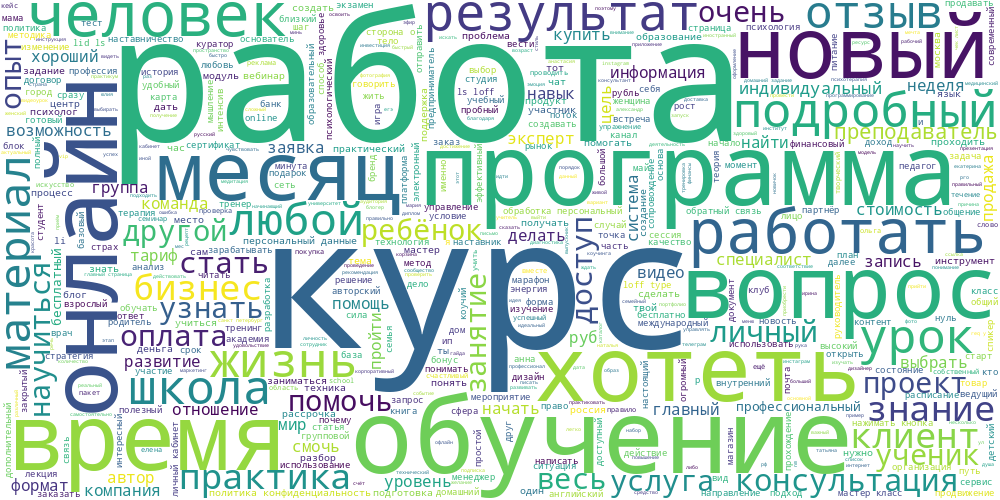

In [90]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование']["parsed_text"])

In [91]:
print('общий размер датасета', data.shape[0])
print('количество элементов не из образования', data[data['base_category_nm'] != 'Образование']['parsed_text'].count())
print('количество элементов из образования', data[data['base_category_nm'] == 'Образование']['parsed_text'].count())
print('максимальный размер строки в датасете', max(len(i) for i in data['parsed_text']))

общий размер датасета 36891
количество элементов не из образования 28527
количество элементов из образования 8364
максимальный размер строки в датасете 512


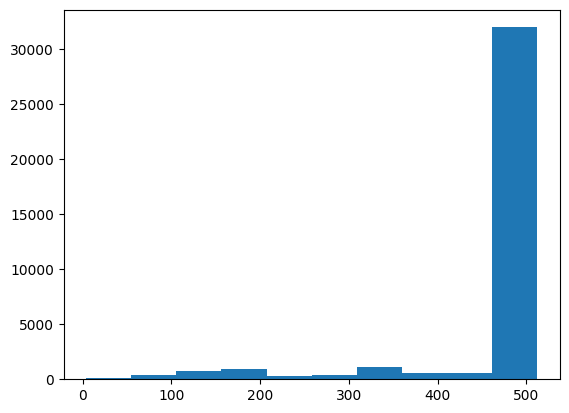

In [13]:
plt.hist([len(i) for i in data['parsed_text']])
plt.show()

In [9]:
tokenizer = AutoTokenizer.from_pretrained('intfloat/multilingual-e5-large')
model = AutoModel.from_pretrained('intfloat/multilingual-e5-large').to(device)

tokenizer_config.json:   0%|          | 0.00/418 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/280 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/690 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.24G [00:00<?, ?B/s]

In [10]:
data['text'] = data['parsed_text'].apply(lambda x: "query: " + x)
data.head()

,url,base_category_nm,parsed_text,text
0,https://aspect-school.ru,Образование,курс маникюр школа обучение ученик мастер ногт...,query: курс маникюр школа обучение ученик маст...
1,https://rlagency.ru,Развлечения,билет купить руб подробный любовь дк павлово с...,query: билет купить руб подробный любовь дк па...
2,https://kozlovatravel.u-on.ru,Развлечения,Автоматизированная система U ON Travel Забыли ...,query: Автоматизированная система U ON Travel ...
3,https://rootsyou.tilda.ws,Красота,крем мыло баттеры аромароллер косметика душа п...,query: крем мыло баттеры аромароллер косметика...
4,https://esk.one/p/wadgpcigy2vveo,Образование,прототип блок схема поддержка mind esk one сер...,query: прототип блок схема поддержка mind esk ...


In [11]:
dataset = Dataset.from_pandas(data[data["base_category_nm"] == 'Образование'])

In [12]:
%%time

TEST_SIZE = 0.3
SPLIT_RANDOM_SEED = 42
MAX_LENGTH = 512

# batch_dict = dataset.map(encode, batched=True, remove_columns="text")
batch_dict = tokenizer(dataset["text"], max_length=512, padding=True, truncation=True, return_tensors='pt')

trans_dataset = TensorDataset(batch_dict['input_ids'], batch_dict['attention_mask'])

CPU times: user 6.56 s, sys: 359 ms, total: 6.92 s
Wall time: 3.31 s


In [13]:
batch_size = 1
data_loader = DataLoader(trans_dataset, batch_size=batch_size, shuffle=False)

In [14]:
%%time

def average_pool(last_hidden_states: Tensor, attention_mask: Tensor) -> Tensor:
    last_hidden = last_hidden_states.masked_fill(~attention_mask[..., None].bool(), 0.0)
    return last_hidden.sum(dim=1) / attention_mask.sum(dim=1)[..., None]

model.eval()
result = None
for input_ids, attention_mask in tqdm(data_loader, desc=f'Trans'):
    input_ids = input_ids.to(device)
    attention_mask = attention_mask.to(device)
    
    out = model(input_ids, attention_mask=attention_mask)
    embeddings = average_pool(out.last_hidden_state, attention_mask)
    
    res = embeddings.cpu().detach().numpy().astype("float")
    if result is None:
        result = res.copy()
    else:
        result = np.append(result, res, axis=0)

Trans: 100%|██████████| 8364/8364 [08:09<00:00, 17.09it/s]

CPU times: user 7min 26s, sys: 43.6 s, total: 8min 10s
Wall time: 8min 9s


In [15]:
result.shape

(8364, 1024)

In [29]:
import gc
torch.cuda.empty_cache()
gc.collect()

0

In [27]:
kmeans = KMeans(n_clusters=15).fit(result)

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


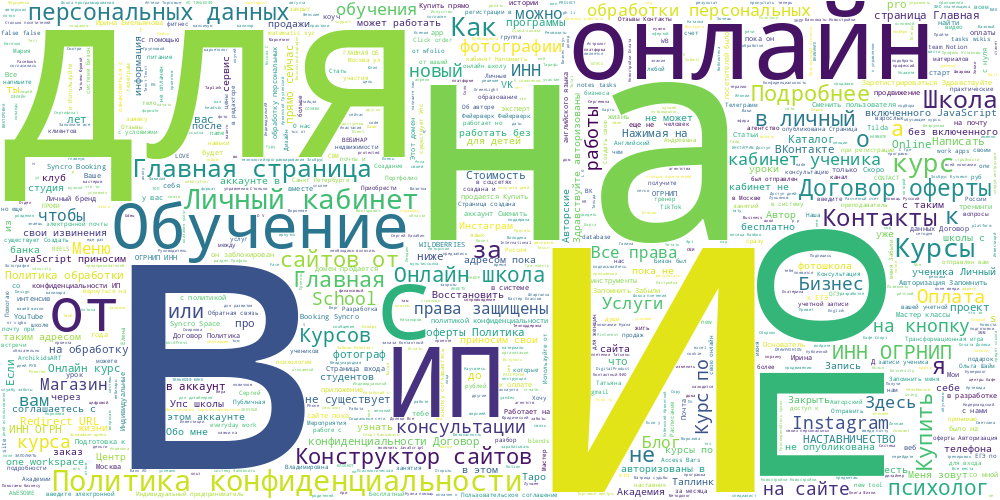

In [28]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 0].parsed_text)

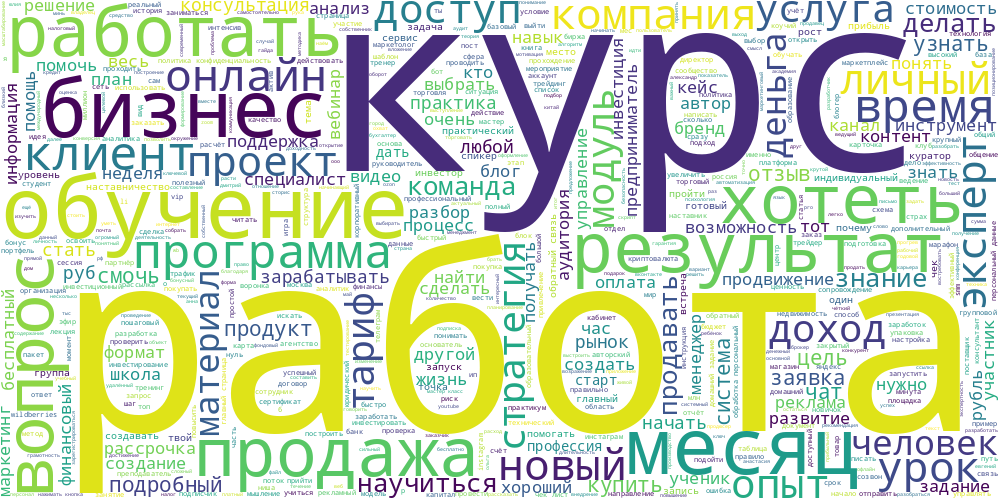

In [29]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 1].parsed_text)

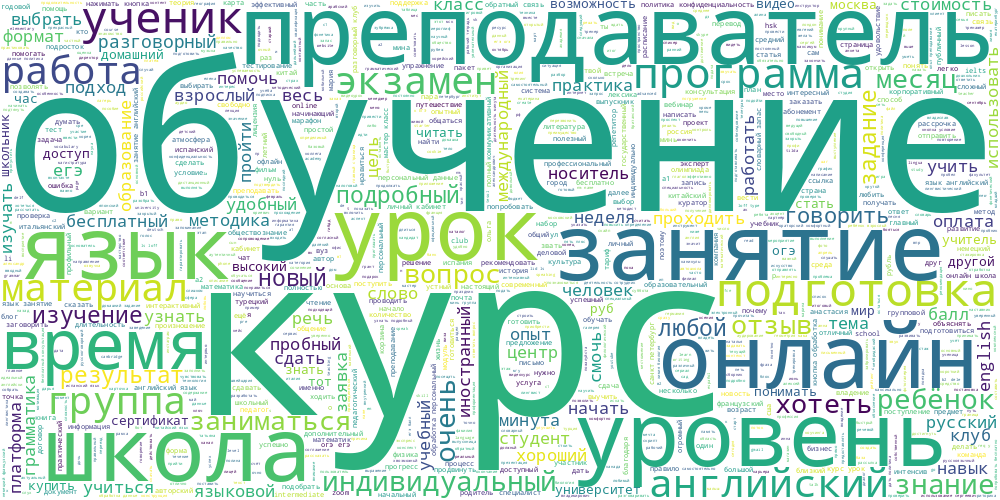

In [45]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 2].parsed_text)

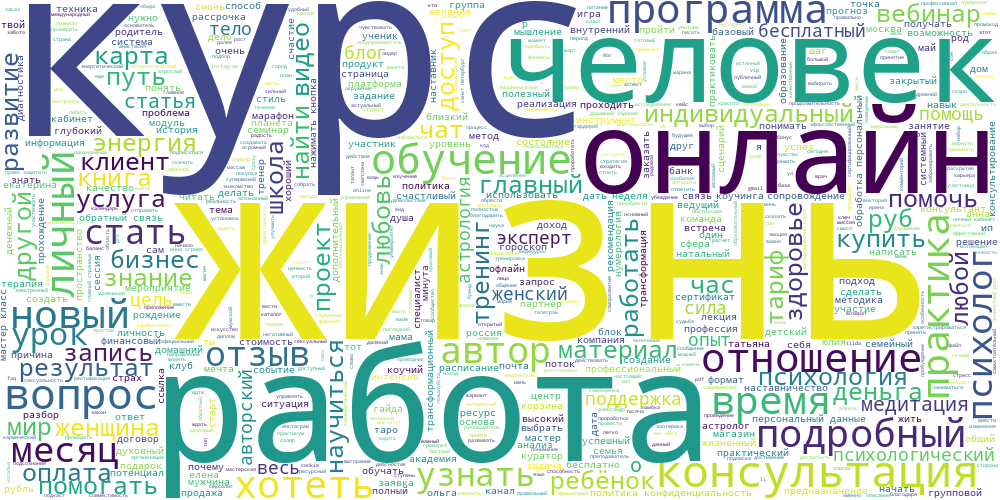

In [44]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 3].parsed_text)

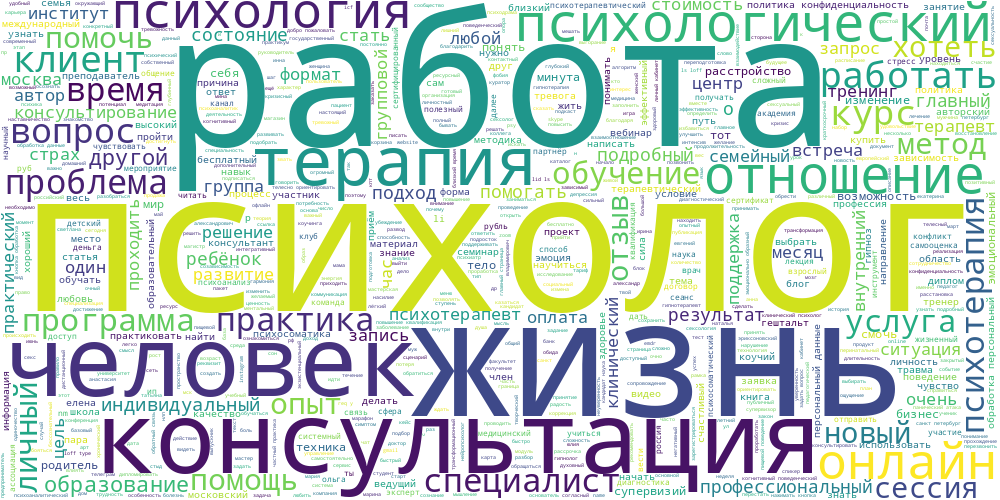

In [43]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 4].parsed_text)

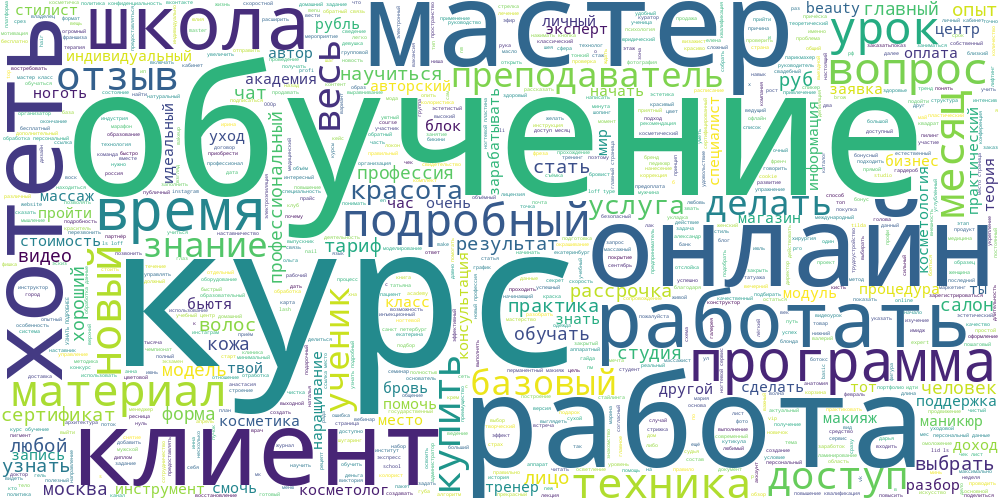

In [42]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 5].parsed_text)

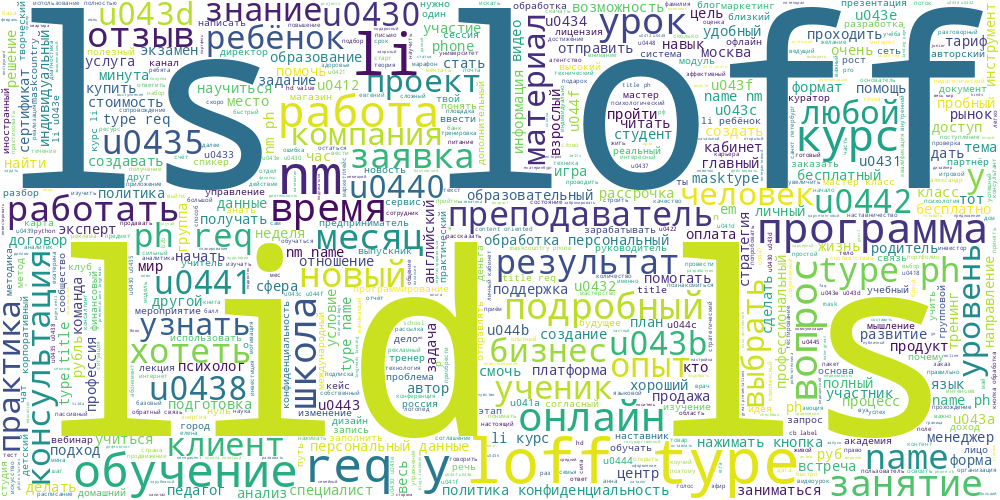

In [41]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 6].parsed_text)

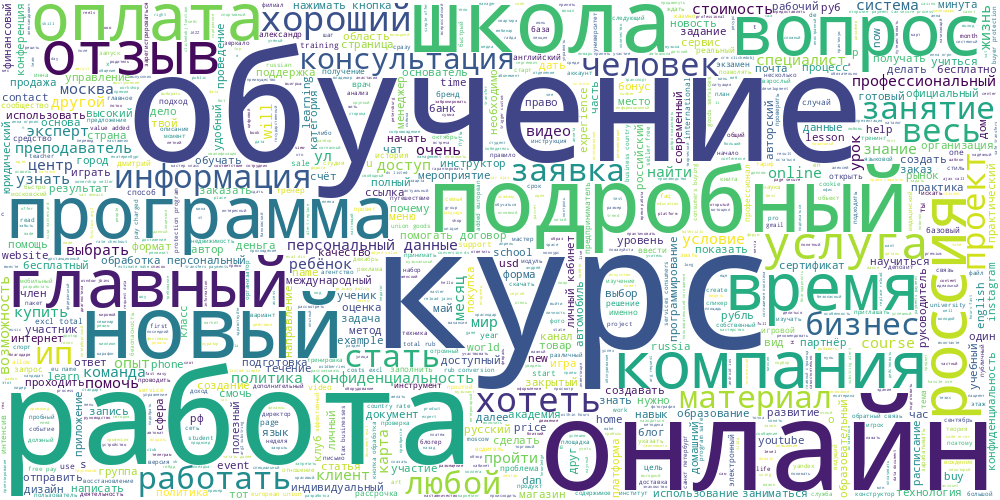

In [40]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 7].parsed_text)

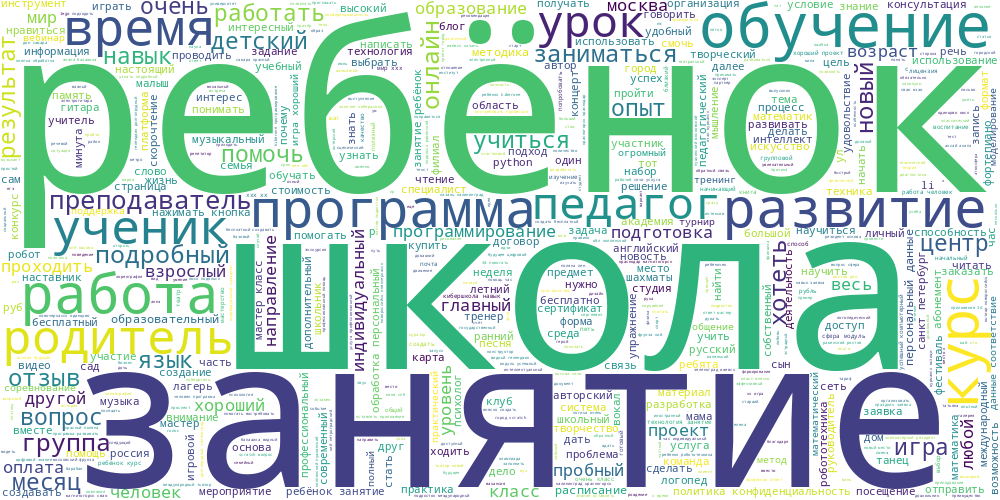

In [38]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 8].parsed_text)

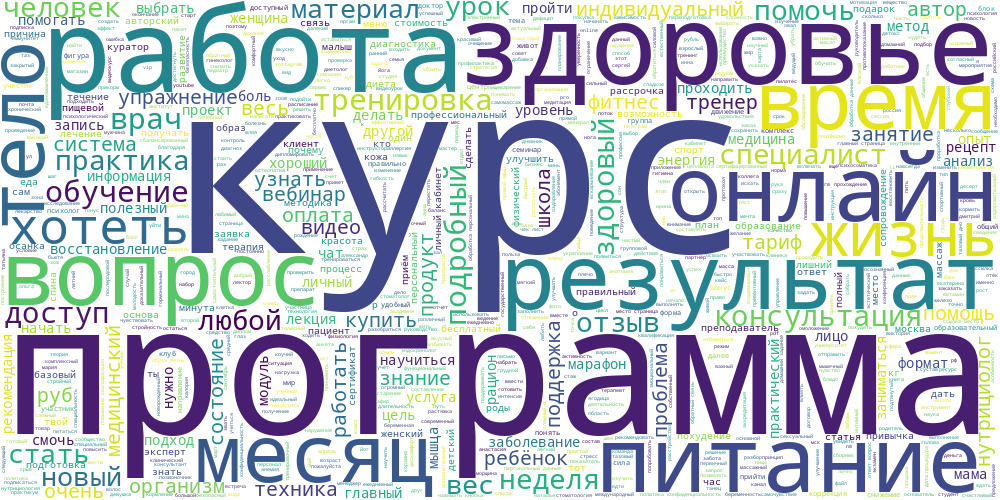

In [37]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 9].parsed_text)

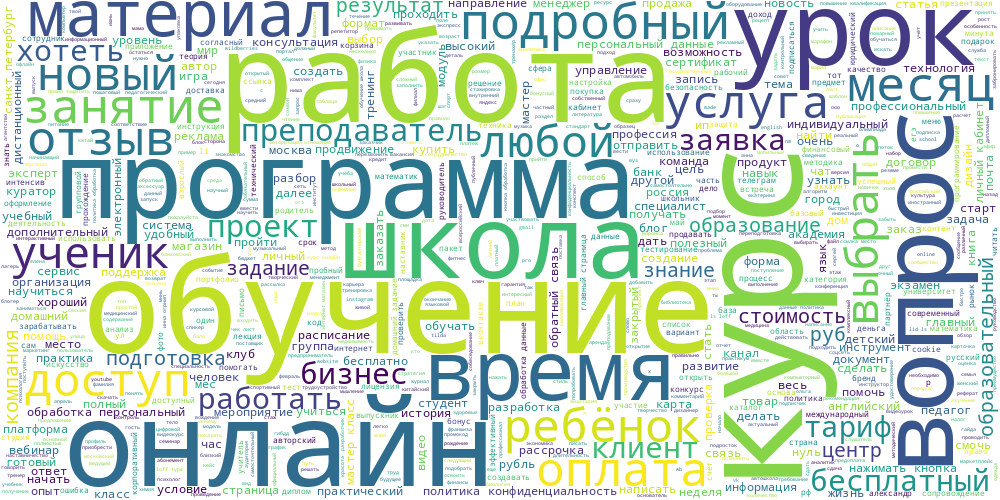

In [36]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 10].parsed_text)

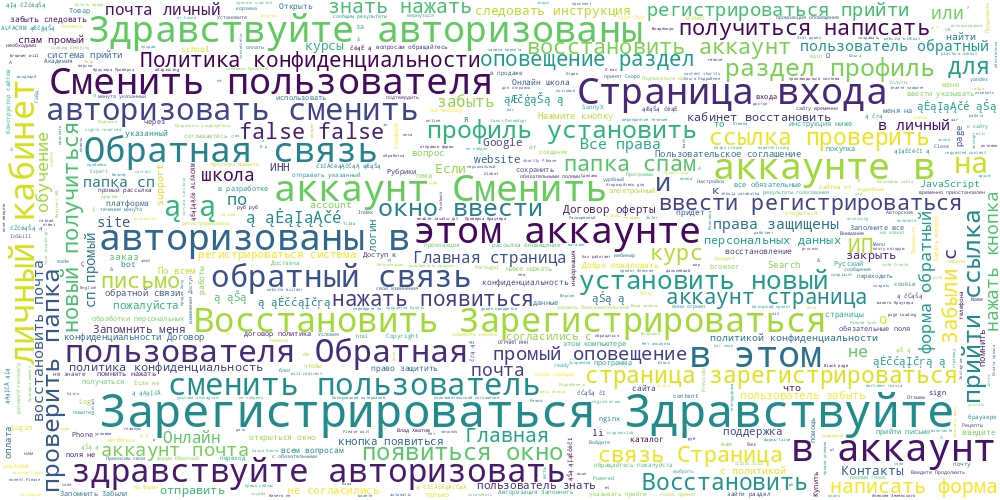

In [35]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 11].parsed_text)

In [34]:
data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 11]

,url,base_category_nm,parsed_text,text
189,https://st.first-code.ru,Образование,Главная страница first code Главная Онлайн зап...,query: Главная страница first code Главная Онл...
228,https://zalevskaialina.ru,Образование,восстановить аккаунт страница зарегистрировать...,query: восстановить аккаунт страница зарегистр...
366,https://school.happycollections.ru,Образование,Приносим свои извинения Доступ к сайту временн...,query: Приносим свои извинения Доступ к сайту ...
809,https://рспро.рф,Образование,Just a moment Please turn JavaScript on and re...,query: Just a moment Please turn JavaScript on...
1013,https://birdschool.ru,Образование,Рады вас видеть Забыли Восстановить Нет аккаун...,query: Рады вас видеть Забыли Восстановить Нет...
...,...,...,...,...
36748,https://pqzlj.tb.ru,Образование,Главная страница Главная страница К оплате Кон...,query: Главная страница Главная страница К опл...
36903,https://vozhdenium.com,Образование,Твоя новая жизнь Хочу посетить крутой вебинар ...,query: Твоя новая жизнь Хочу посетить крутой в...
36949,https://lifeacademy.space,Образование,تسجيل الدخول تفاصيل تسجيل الدخول تذكرني نسيت ك...,query: تسجيل الدخول تفاصيل تسجيل الدخول تذكرني...
36954,https://massageschool.tb.ru/product-vkxunkt,Образование,Товар Товар Главная К покупкам К покупкам Наза...,query: Товар Товар Главная К покупкам К покупк...


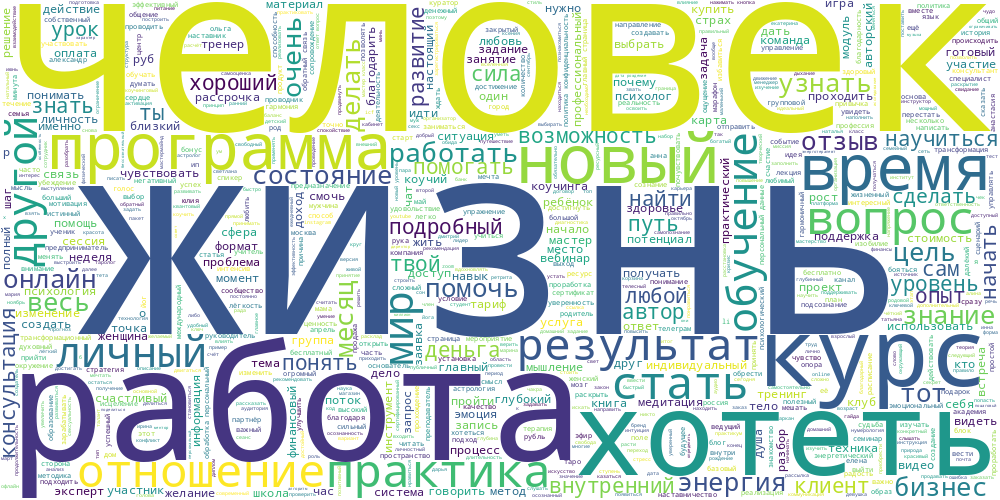

In [32]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 12].parsed_text)

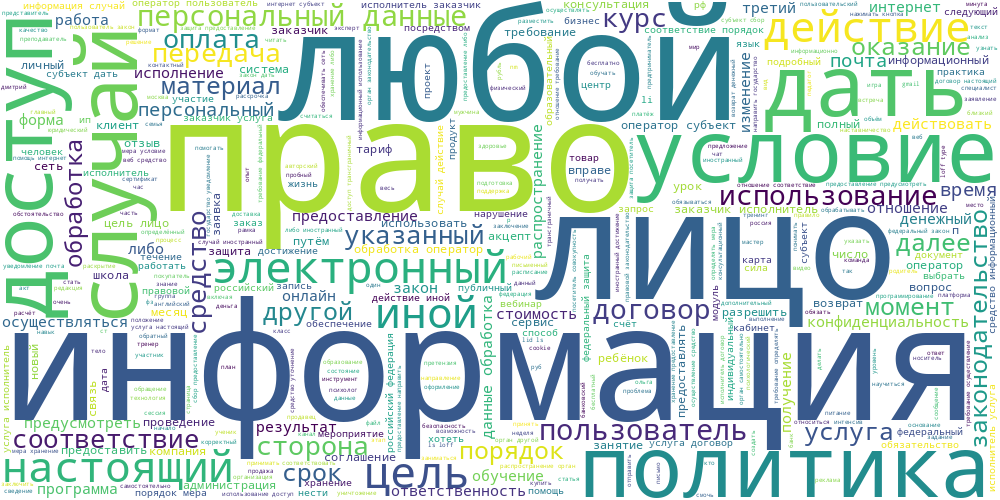

In [31]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 13].parsed_text)

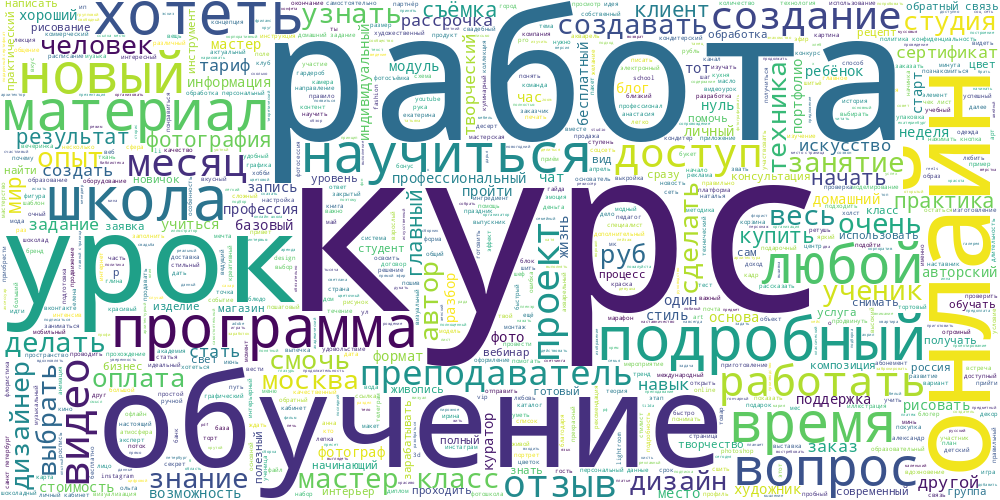

In [30]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 14].parsed_text)

In [16]:
kmeans = KMeans(n_clusters=4).fit(result)

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


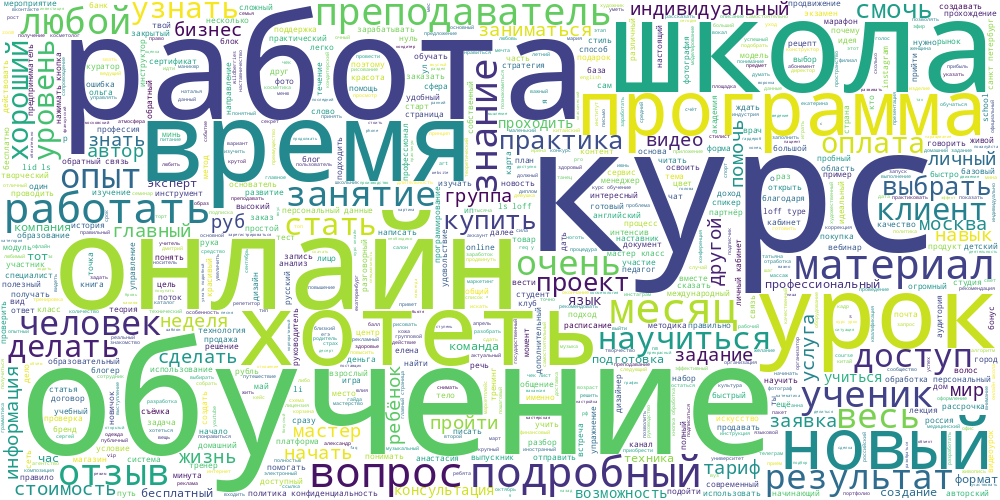

In [26]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 0].parsed_text)

In [25]:
data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 0]

,url,base_category_nm,parsed_text,text
0,https://aspect-school.ru,Образование,курс маникюр школа обучение ученик мастер ногт...,query: курс маникюр школа обучение ученик маст...
4,https://esk.one/p/wadgpcigy2vveo,Образование,прототип блок схема поддержка mind esk one сер...,query: прототип блок схема поддержка mind esk ...
9,https://impoliakov.ru,Образование,практикум ui ux дизайнер работа профессия диза...,query: практикум ui ux дизайнер работа професс...
25,https://speakyricky.com/speaky-ricky-kommunarka,Образование,английский язык коммунарка языковой speaky ric...,query: английский язык коммунарка языковой spe...
37,https://armwrestlingschool.ru,Образование,x вид спорт armwrestlingschool соревнование тр...,query: x вид спорт armwrestlingschool соревнов...
...,...,...,...,...
37036,https://boarford.ru,Образование,занятие студия boarford язык очень химки отзыв...,query: занятие студия boarford язык очень химк...
37050,https://margarita-vitaliy.com,Образование,тренировка тело тнг твой упражнение руб маргар...,query: тренировка тело тнг твой упражнение руб...
37090,https://artemronin.com,Образование,россия фотография работать проект com artem ro...,query: россия фотография работать проект com a...
37108,https://lp-sky-school.ru,Образование,курс иллюстрация li ipad ученик онлайн вопрос ...,query: курс иллюстрация li ipad ученик онлайн ...


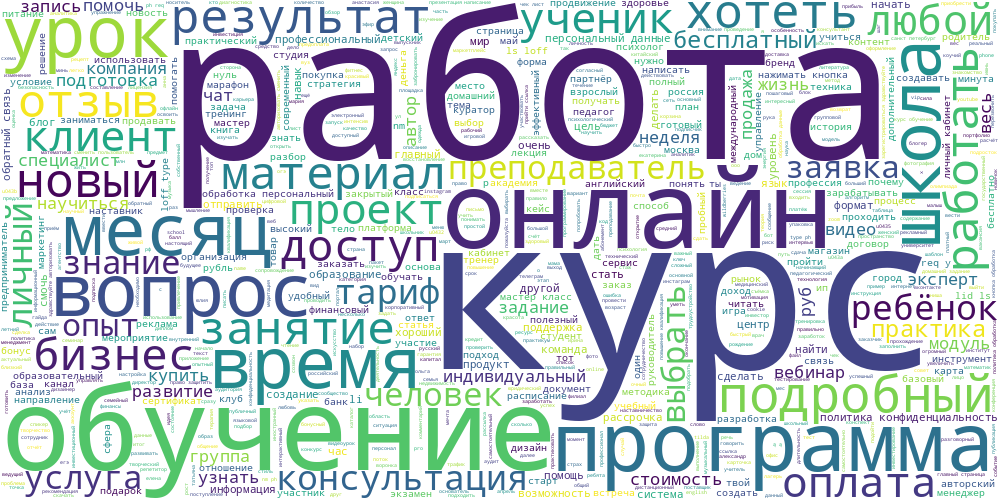

In [24]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 1].parsed_text)

In [23]:
data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 1]

,url,base_category_nm,parsed_text,text
10,https://bargana.space,Образование,li bargana nm name space специалист lid ls lof...,query: li bargana nm name space специалист lid...
56,https://dnative.ru,Образование,smm dnative подписаться блог подкаст стратегия...,query: smm dnative подписаться блог подкаст ст...
57,https://webinar.wildmanager.ru,Образование,зарегистрироваться товар вебинар гайда оформле...,query: зарегистрироваться товар вебинар гайда ...
63,https://julialenochkina.ru,Образование,питание растительный человек книга подарок хор...,query: питание растительный человек книга пода...
89,https://pixelperfect.fun,Образование,text link webflow upwork анимация вопрос проек...,query: text link webflow upwork анимация вопро...
...,...,...,...,...
37024,https://highlevel.tb.ru/highlevelschool,Образование,курс выбрать урок подробный новый онлайн творч...,query: курс выбрать урок подробный новый онлай...
37030,https://pixel-map.ru,Образование,дизайн курс работа ux дизайнер li директор ui ...,query: дизайн курс работа ux дизайнер li дирек...
37033,https://specialnoe-predlozhenie.tb.ru,Образование,марафон желание specialnoe predlozhenie blinov...,query: марафон желание specialnoe predlozhenie...
37045,https://yamunacake.ru,Образование,торт кг человек подробный руб вес команда отзы...,query: торт кг человек подробный руб вес коман...


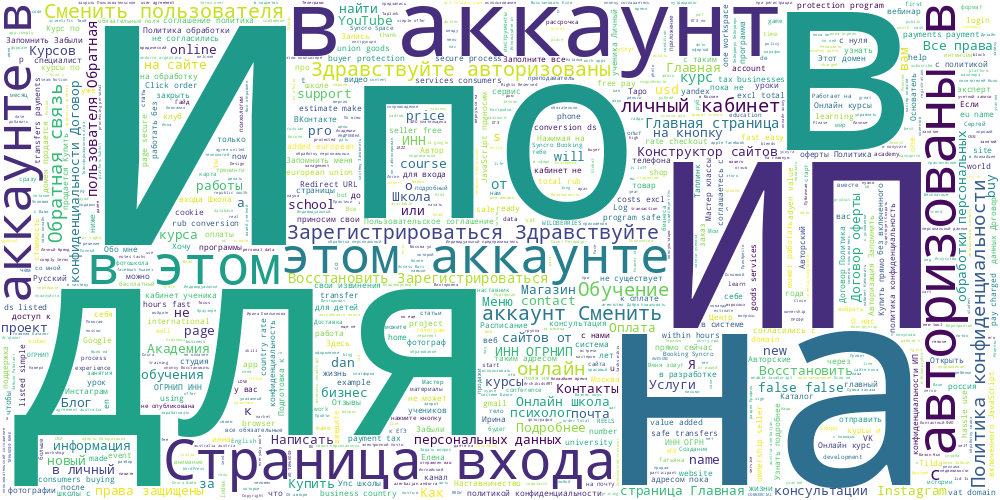

In [22]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 2].parsed_text)

In [21]:
data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 2]

,url,base_category_nm,parsed_text,text
15,https://sodrsystem.ru,Образование,содружество р sodruzhestvo amway бизнес друг л...,query: содружество р sodruzhestvo amway бизнес...
29,https://artemovsergey.com,Образование,Обучение и курсы по Канбан методу Сертифициров...,query: Обучение и курсы по Канбан методу Серти...
69,https://moskills.kassa.bizon365.ru/buy/moskill...,Образование,Школа маркетплейсов Moskills ВЕБИНАР ШАГОВ ДЛЯ...,query: Школа маркетплейсов Moskills ВЕБИНАР ША...
75,https://housedance.pro,Образование,Танцуй где когда и в чем тебе удобно Подбирай ...,query: Танцуй где когда и в чем тебе удобно По...
99,https://legkoved.ru,Образование,Легковед Л Е К О В Е Д Блог Голодание Основате...,query: Легковед Л Е К О В Е Д Блог Голодание О...
...,...,...,...,...
36954,https://massageschool.tb.ru/product-vkxunkt,Образование,Товар Товар Главная К покупкам К покупкам Наза...,query: Товар Товар Главная К покупкам К покупк...
36965,https://art-fusion.me,Образование,Студия современного творчества в Челябинске уд...,query: Студия современного творчества в Челяби...
37010,https://dharma-jyotish-siddhanta-yogi-ashram.com,Образование,сатьят наст паро дхармах Дхарма Джйотиш Сиддха...,query: сатьят наст паро дхармах Дхарма Джйотиш...
37042,https://zemi.online,Образование,the domain you is in for vat of we transfer an...,query: the domain you is in for vat of we tran...


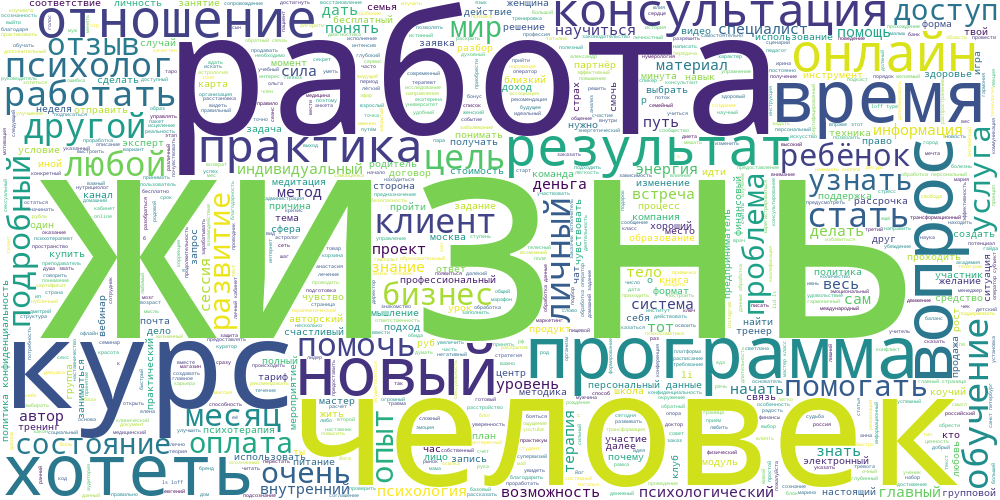

In [20]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 3].parsed_text)

In [19]:
data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 3]

,url,base_category_nm,parsed_text,text
12,https://larisasitnikova.ru/#top,Образование,тренинг развитие индивидуальный навык бизнес ц...,query: тренинг развитие индивидуальный навык б...
18,https://sviyash-center.ru,Образование,свияша тренинг александр найти любовь отзыв кн...,query: свияша тренинг александр найти любовь о...
35,https://uptrend.club,Образование,курс человек жизнь узнать научиться подавление...,query: курс человек жизнь узнать научиться под...
49,https://sashaxarlova.ru,Образование,сессия хотеть работа работать бизнес деньга ко...,query: сессия хотеть работа работать бизнес де...
58,https://anastasiayakubova.com,Образование,вещь гардероб стиль разбор услуга образ шопинг...,query: вещь гардероб стиль разбор услуга образ...
...,...,...,...,...
37062,https://projectmy.ru,Образование,li u043e инвестировать u0430 u043d u0441 время...,query: li u043e инвестировать u0430 u043d u044...
37075,https://alekhina-agency.ru/salesworkshop,Образование,продажа счастие продукт бонус июль долгосрочны...,query: продажа счастие продукт бонус июль долг...
37078,https://yanamikitenko.tilda.ws,Образование,тренинг тело доступ прийти боль травма избавит...,query: тренинг тело доступ прийти боль травма ...
37098,https://arinastrelets.com,Образование,видео опыт мастер класс партнёр оплата сфера к...,query: видео опыт мастер класс партнёр оплата ...


In [46]:
kmeans = KMeans(n_clusters=3).fit(result)

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


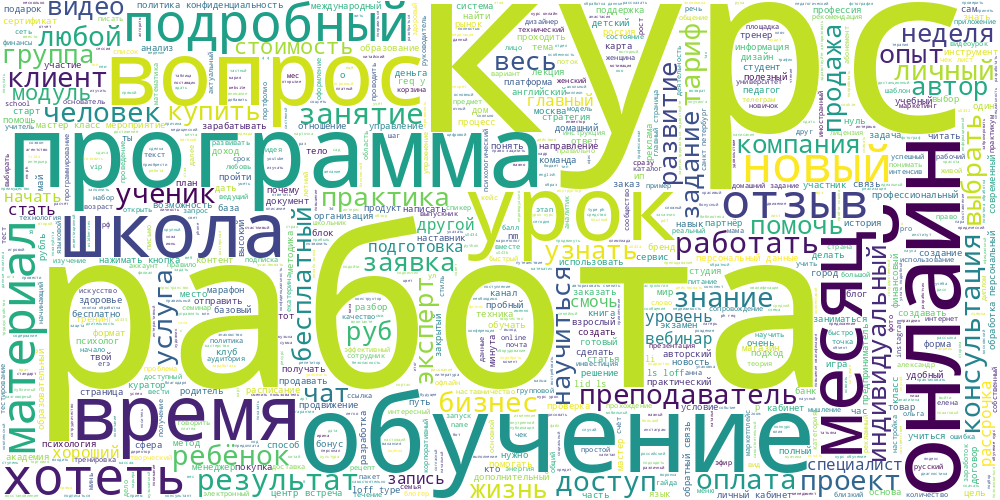

In [47]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 0].parsed_text)

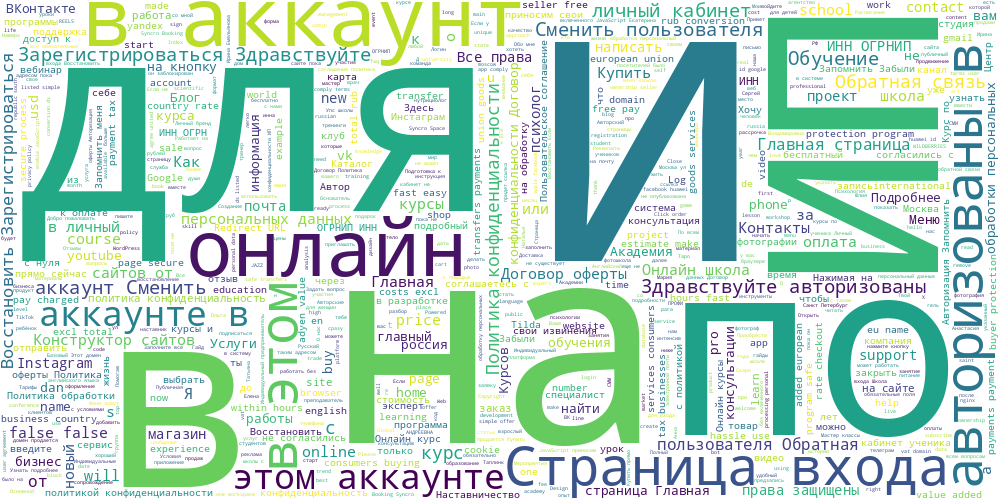

In [48]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 1].parsed_text)

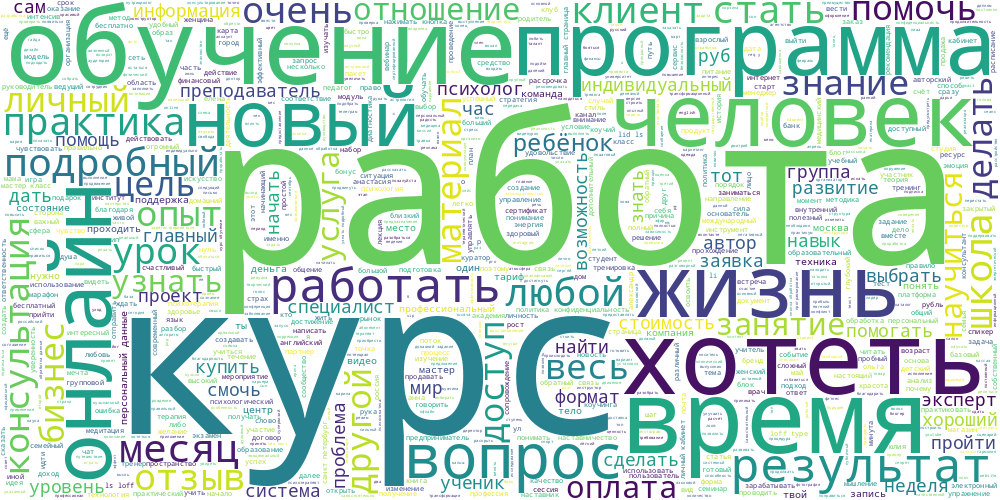

In [49]:
draw_wordcloud(data[data["base_category_nm"] == 'Образование'][kmeans.labels_ == 2].parsed_text)